In [1]:
import pandas as pd
import numpy as np
import re

from sklearn.cluster import MiniBatchKMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
import matplotlib.cm as cm

from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

import nltk
import string
nltk.download('maxent_ne_chunker')
nltk.download('words')

from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\lingadhar_duggirala\AppData\Roaming\nltk_data
[nltk_data]     ...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\lingadhar_duggirala\AppData\Roaming\nltk_data
[nltk_data]     ...
[nltk_data]   Package words is already up-to-date!


In [2]:
def untokenize(tokens):
    return("".join([" "+i if not i.startswith("'") and i not in string.punctuation else i for i in tokens]).strip())

def ne_removal(text):
    tokens = nltk.word_tokenize(text)
    chunked = nltk.ne_chunk(nltk.pos_tag(tokens))
    tokens = [leaf[0] for leaf in chunked if type(leaf) != nltk.Tree]
    return(untokenize(tokens))

In [3]:
data=pd.read_csv("C:\\Users\\lingadhar_duggirala\\Desktop\\Keydocs\\data.csv")

In [4]:
data_tst=pd.read_csv("C:\\Users\\lingadhar_duggirala\\Desktop\\Keydocs\\19082019.csv")

In [246]:
string1 = "employment agreement this employment agreement agreement is effective as of"
words = string1.split()
print (" ".join(sorted(set(words), key=words.index)))

employment agreement this is effective as of


In [219]:
a=data_tst[data_tst.Relevancy=='Valid']

In [220]:
a=a.reset_index()

In [239]:
a.text=a.text.apply(lambda x:re.sub('^\d+','',str(x)))

In [241]:
a.text=a.text.apply(lambda x:re.sub('^\w\d|\d\w','',str(x).lower()))

In [221]:
a=a.drop('index',axis=1)

In [229]:
a.text[4][0:a.text[4].find(re.search("20\d\d",a.text[4]).group())+4]

'Amended and Restated Quest Diagnostics Incorporated Employee Long Term Incentive Plan As amended May 14 2019'

In [4]:
data.shape

(5674, 6)

In [55]:
data.text=data.text.apply(lambda x:re.sub("^\d+","",str(x)))
#data.text=data.text.apply(lambda x:ne_removal(" ".join(str(x).split()[0:25])))

C:\Users\lingadhar_duggirala\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\generic.py:4405: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


In [7]:
data.text[25]

'UNDER THE CORPORATIONS ACT GROWERS INC CERT THIS CERTIFIES THAT SPECIMEN IS HOLDER OF NINE AND FULLY PAID'

In [5]:
def text_preprocess(txt):
    txto=""
    txt=re.sub("\d+"," ",txt)
    txt=re.sub("[^a-zA-Z0-9]"," ",txt)
    txt=re.sub("\bex\b|\bexhibit\b|ex\b|ex |exhibit\b","",txt.lower())
    txt=re.sub("\s+"," ",txt)
    txt=re.sub("^\s+","",txt)
    txt=txt.lower()
    for w in txt.split():
        if not w in stop_words:
            txto+=" "+w
    return txto

In [10]:
data["curated_text"]=""
for ind,row in data.iterrows():
    data.loc[ind,['curated_text']]=text_preprocess(str(row['text']))

data['op_text']=data.curated_text.apply(lambda x:" ".join(x.split()[0:20]))

In [38]:
data_tst["curated_text"]=""
for ind,row in data_tst.iterrows():
    data_tst.loc[ind,['curated_text']]=text_preprocess(str(row['text']))
    
data_tst['op_text']=data_tst.curated_text.apply(lambda x:" ".join(x.split()[0:20]))
words=set()
for ind,row in data_tst.iterrows():
    for w in row['op_text'].split():
        words.add(w)

In [10]:
len(words)

4861

In [11]:
data.op_text[27]

'articles sections name number growers inc corporation amended pursuant'

In [12]:
vect_word = TfidfVectorizer(max_features=5200, lowercase=True, analyzer='word',
                        stop_words= 'english',ngram_range=(1,3),dtype=np.float32)
textvector = vect_word.fit_transform(data['op_text'])

In [13]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer
from sklearn.decomposition import TruncatedSVD

Number of components = 4 and explained variance = 0.09362445
Number of components = 10 and explained variance = 0.16719426
Number of components = 15 and explained variance = 0.2018596
Number of components = 20 and explained variance = 0.22587846
Number of components = 50 and explained variance = 0.32283232
Number of components = 100 and explained variance = 0.42394656
Number of components = 150 and explained variance = 0.49435216
Number of components = 200 and explained variance = 0.5481483
Number of components = 500 and explained variance = 0.7451813
Number of components = 700 and explained variance = 0.8213799
Number of components = 800 and explained variance = 0.8508503
Number of components = 900 and explained variance = 0.8758515
Number of components = 1000 and explained variance = 0.8971455
Number of components = 1500 and explained variance = 0.9629211
Number of components = 2000 and explained variance = 0.98951995
Number of components = 2500 and explained variance = 0.99816155
Nu

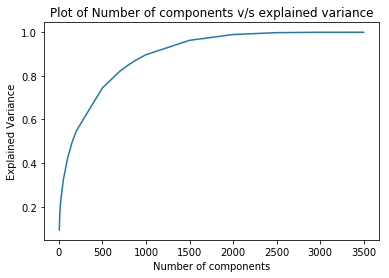

In [69]:
# Program to find the optimal number of components for Truncated SVD
n_comp = [4,10,15,20,50,100,150,200,500,700,800,900,1000,1500,2000,2500,3000,3500] # list containing different values of components
explained = [] # explained variance ratio for each component of Truncated SVD
for x in n_comp:
    svd = TruncatedSVD(n_components=x)
    svd.fit(textvector)
    explained.append(svd.explained_variance_ratio_.sum())
    print("Number of components = %r and explained variance = %r"%(x,svd.explained_variance_ratio_.sum()))
plt.plot(n_comp, explained)
plt.xlabel('Number of components')
plt.ylabel("Explained Variance")
plt.title("Plot of Number of components v/s explained variance")
plt.show()

In [12]:
vect_word_mod = TfidfVectorizer(max_features=2000, lowercase=True, analyzer='word',
                        stop_words= 'english',ngram_range=(1,3),dtype=np.float32)
textvector_mod = vect_word_mod.fit_transform(data['op_text'])

In [40]:
textvector_tst=vect_word_mod.transform(data_tst['op_text'])

In [14]:
data['can_ind']=data['text'].apply(lambda x:"Cancel" if len(str(x))<10 else "Proceed")

In [41]:
data_tst['can_ind']=data_tst['text'].apply(lambda x:"Cancel" if len(str(x))<10 else "Proceed")

In [121]:
data['Relevancy']=data['op_text'].apply(lambda x:"Valid" if any(y in str(x).lower() for y in ["agreement","by laws","by law","bylaws","bylaw","law ","laws ","incorporation","incorporated","indenture","certificate","articles","amendment","amended"," plan ","warrant "]) else "Invalid" )

In [119]:
data_tst['Relevancy']=data_tst['op_text'].apply(lambda x:"Valid" if any(y in str(x).lower() for y in ["agreement","by laws","by law","bylaws","bylaw","law ","laws ","incorporation","incorporated","indenture","certificate","articles","amendment","amended"," plan ","warrant"]) else "Invalid" )

In [36]:
a=data[data.can_ind=='Proceed'][['KeyFileCollection','SNPVersionID','KeyFileCollectionDetail','exhibit','Relevancy']]

In [43]:
b=data_tst[data_tst.can_ind=='Proceed'][['KeyFileCollection','SNPVersionID','KeyFileCollectionDetail','exhibit','Relevancy']]

In [37]:
a.to_excel('C:\\Users\\lingadhar_duggirala\\Desktop\\Keydocs\\20082019.xlsx')

In [110]:
data=data[data.can_ind=='Proceed']

In [114]:
pd.set_option('display.max_rows', 5000)

In [122]:
data[data.Relevancy=='Invalid']

,Unnamed: 0,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,text,curated_text,op_text,can_ind,Relevancy
0,0,119104618,734418872.0,328764637,EX-101,ex 101 400 3 31 2021 28 Loan 98 JPMCB JPMorgan...,loan jpmcb jpmorgan chase bank national assoc...,loan jpmcb jpmorgan chase bank national associ...,Proceed,Invalid
1,1,119104618,734418872.0,328764637,EX-2008,ex 2008 NAP 92 000 SF 76 09 40 Loan 119 120 GA...,nap sf loan gacc deutsche bank ag new york br...,nap sf loan gacc deutsche bank ag new york bra...,Proceed,Invalid
2,2,119484700,740857088.0,330107904,EX-99.1,Coca Cola Reports Continued Momentum in Second...,coca cola reports continued momentum second q...,coca cola reports continued momentum second qu...,Proceed,Invalid
3,3,119482149,740799682.0,330099611,EX-99.1,NEWS RELEASE Bonanza Creek Issues Preliminary ...,news release bonanza creek issues preliminary...,news release bonanza creek issues preliminary ...,Proceed,Invalid
4,4,119163985,735457280.0,328891854,EX-99.3,For Immediate Release Alexandria Real Estate E...,immediate release alexandria real estate equi...,immediate release alexandria real estate equit...,Proceed,Invalid
5,5,119163985,735457280.0,328891854,EX-99.1,For Immediate Release Alexandria Real Estate E...,immediate release alexandria real estate equi...,immediate release alexandria real estate equit...,Proceed,Invalid
6,6,119163985,735457280.0,328891854,EX-99.2,For Immediate Release Alexandria Real Estate E...,immediate release alexandria real estate equi...,immediate release alexandria real estate equit...,Proceed,Invalid
7,7,119497389,741092280.0,330132825,EX-101.,INS XBRL Instance Document SCH XBRL Taxonomy E...,ins xbrl instance document sch xbrl taxonomy ...,ins xbrl instance document sch xbrl taxonomy e...,Proceed,Invalid
8,8,119047464,733385754.0,328635241,EX-31.1,CERTIFICATION CERTIFICATION PURSUANT TO SECTIO...,certification certification pursuant section ...,certification certification pursuant section s...,Proceed,Invalid
9,9,119047464,733385754.0,328635241,EX-32.1,CERTIFICATION CERTIFICATION PURSUANT TO 18 U S...,certification certification pursuant u c sect...,certification certification pursuant u c secti...,Proceed,Invalid


In [125]:
data.text[194]

'Table of Contents Confidential Treatment Requested by Oportun Financial Corporation Pursuant to 17 C F R Section 200 83 Certain confidential information contained in this document marked by brackets has been omitted and filed separately with the Securities and Exchange Commission pursuant to Rule 406 of the Securities Act of 1933 as amended Execution Version AMENDED AND RESTATED PURCHASE AND SALE AGREEMENT Dated as of June 29 2018 between ECL FUNDING LLC as Purchaser and OPORTUN INC as Seller Table of Contents Confidential Treatment Requested by Oportun Financial Corporation Pursuant to 17 C F R Section 200 83 TABLE OF CONTENTS Page ARTICLE I DEFINITIONS 1 SECTION 1 1 Certain Defined Terms 1 SECTION 1 2 Accounting and UCC Terms 15 ARTICLE II AMOUNTS AND TERMS OF THE PURCHASES 15 SECTION 2 1 Purchase of Receivables 15 SECTION 2 2 Purchase and Sale Commitment 16 SECTION 2 3 Purchase Price and Payment Procedures 19 SECTION 2 4 Repurchase of Ineligible Receivables 20 SECTION 2 5 Refinanci

In [111]:
data_valid=data[data.Relevancy=='Valid']

In [112]:
data_valid

,Unnamed: 0,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,text,curated_text,op_text,can_ind,Relevancy
18,18,119037722,733334798.0,328615333,EX-99.1,MONTHLY SERVICER S CERTIFICATE CARMAX BUSINESS...,monthly servicer certificate carmax business ...,monthly servicer certificate carmax business s...,Proceed,Valid
25,25,119486901,740872930.0,330113990,EX-4.1,INCORPORATED UNDER THE ALBERTA BUSINESS CORPOR...,incorporated alberta business corporations ac...,incorporated alberta business corporations act...,Proceed,Valid
26,26,119486901,740872930.0,330113990,EX-3.2,BY LAW NO 1 A by law relating generally to th...,law law relating generally transaction busine...,law law relating generally transaction busines...,Proceed,Valid
27,27,119486901,740872930.0,330113990,EX-3.1,Articles Of Amendment Business Corporations Ac...,articles amendment business corporations act ...,articles amendment business corporations act s...,Proceed,Valid
28,28,119486901,740872930.0,330113990,EX-1.1,Sundial Growers Inc Common Shares Underwriting...,sundial growers inc common shares underwritin...,sundial growers inc common shares underwriting...,Proceed,Valid
30,30,119486901,740872930.0,330113990,EX-10.8,Certain information in this document marked by...,certain information document marked brackets ...,certain information document marked brackets e...,Proceed,Valid
32,32,119486901,740872930.0,330113990,EX-3.3,Articles of Amendment Business Corporations Ac...,articles amendment business corporations act ...,articles amendment business corporations act s...,Proceed,Valid
33,33,119486901,740872930.0,330113990,EX-10.5,Certain information in this document marked by...,certain information document marked brackets ...,certain information document marked brackets e...,Proceed,Valid
34,34,119486901,740872930.0,330113990,EX-10.9,Execution Version SHARE PURCHASE AGREEMENT BET...,execution version share purchase agreement ed...,execution version share purchase agreement edw...,Proceed,Valid
39,39,119443154,740056766.0,329997396,EX-99.1,Volkswagen Auto Loan Enhanced Trust 2018 2 Exh...,volkswagen auto loan enhanced trust exhibit m...,volkswagen auto loan enhanced trust exhibit mo...,Proceed,Valid


In [106]:
data_valid.op_text[65]

'power attorney exhibit power attorney know presents undersigned hereby make constitute appoint john morris timothy j murphy one true lawful'

In [60]:
data_valid.text=data_valid.text.apply(lambda x:re.sub('^\d+','',x))

C:\Users\lingadhar_duggirala\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\generic.py:4405: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


In [67]:
re.search('',data_valid.text[30])

<re.Match object; span=(7, 8), match=' '>

In [88]:
data_valid.text[18]

'MONTHLY SERVICER S CERTIFICATE CARMAX BUSINESS SERVICES LLC CARMAX AUTO OWNER TRUST SERIES 2018 2 Collection Period 6 01 19 6 30 19 Determination Date 7 9 2019 Distribution Date 7 15 2019 Additional information including defined terms can be found in the prospectus on the SEC s EDGAR system http www sec gov under File No 333 207329 10 Pool Balance 1 Pool Balance on the close of the last day of the preceding Collection Period 848 911 815 24 2 Collections allocable to Principal 27 469 164 05 3 Purchase Amount allocable to Principal 0 00 4 Defaulted Receivables 1 264 663 00 5 Pool Balance on the close of the last day of the related Collection Period 820 177 988 19 Ln1 Ln2 Ln3 Ln4 6 Total number of Receivables outstanding on the close of the last day of the related Collection Period 59 134 7 Initial Pool Balance 1 336 359 077 55 Beginning of Period End of Period 8 Note Balances a Class A 1 Note Balance 0 00 0 00 b Class A 2 Note Balance 261 342 763 08 232 608 936 03 c Class A 3 Note Balan

In [92]:
data_valid.text[26][data_valid.text[26].find(re.search('[A-Z]{3}',data_valid.text[26]).group()):data_valid.text[26].find(re.search('20\d\d\s',data_valid.text[26]).group())+4]

'LAW NO 1 A by law relating generally to the transaction of the business and affairs of SUNDIAL GROWERS INC As amended and restated on February 5 2018'

In [83]:
re.search("[A-Z]{3}","THESE Film by quentin")

<re.Match object; span=(0, 3), match='THE'>

In [78]:
data_valid.text[34]

'Execution Version SHARE PURCHASE AGREEMENT BETWEEN EDWARD HELLARD and SUNDIAL GROWERS INC July 17 2019 TABLE OF CONTENTS Article 1 INTERPRETATION 1 1 1 Definitions 1 1 2 Certain Rules of Interpretation 4 1 3 Governing Law 4 1 4 Entire Agreement 4 1 5 Schedules and Exhibits 5 Article 2 PURCHASE AND SALE 5 2 1 Agreement of Purchase and Sale 5 2 2 Payment for Purchased Shares 5 Article 3 REPRESENTATIONS AND WARRANTIES OF THE SELLER 6 3 1 Corporate Existence of Corporation 6 3 2 Capacity to Enter Agreement 6 3 3 No Violation 6 3 4 Binding Obligation 6 3 5 Title to Purchased Shares 7 3 6 Issued and Outstanding Shares 7 3 7 No Guarantee 7 3 8 Assets 7 3 9 Liabilities 7 3 10 Director Liability 7 3 11 Financial Statements 7 3 12 Share Capital 7 3 13 Litigation 8 3 14 Residence of Seller 8 3 15 Options 8 Article 4 REPRESENTATIONS AND WARRANTIES OF THE BUYER 8 4 1 Corporate Existence of Buyer 8 4 2 Capacity to Enter Agreement 8 4 3 Binding Obligation 8 4 4 Absence of Conflict 9 4 5 Issued and O

In [44]:
b.to_excel('C:\\Users\\lingadhar_duggirala\\Desktop\\Keydocs\\20082019_tst.xlsx')

In [33]:
data.text[39]

'Volkswagen Auto Loan Enhanced Trust 2018 2 Exhibit 99 1 MONTHLY SERVICER CERTIFICATE For the collection period ended 6 28 2019 PAGE 1 A DATES Begin End days 1 Determination Date 7 18 2019 2 Payment Date 7 22 2019 3 Collection Period 6 1 2019 6 28 2019 28 4 Monthly Interest Period Actual 360 6 20 2019 7 21 2019 32 5 Monthly Interest 30 360 30 B SUMMARY Initial Balance Beginning Balance Principal Payment Ending Balance Note Factor 6 Class A 1 Notes 238 000 000 00 7 Class A 2 A Notes 275 000 000 00 256 994 961 84 22 256 456 45 234 738 505 40 0 8535946 8 Class A 2 B Notes 50 000 000 00 46 726 356 70 4 046 628 44 42 679 728 25 0 8535946 9 Class A 3 Notes 337 000 000 00 337 000 000 00 337 000 000 00 1 0000000 10 Class A 4 Notes 100 000 000 00 100 000 000 00 100 000 000 00 1 0000000 11 Total Securities 1 000 000 000 00 740 721 318 54 26 303 084 89 714 418 233 65 12 Overcollateralization 30 934 557 54 30 934 557 54 30 934 557 54 13 Adjusted Pool Balance 1 030 934 557 54 771 655 876 08 26 303 

In [161]:
data_tst[['KeyFileCollection','SNPVersionID','KeyFileCollectionDetail','exhibit','Relevancy']].to_excel("C:\\Users\\lingadhar_duggirala\\Desktop\\Keydocs\\19082019_results.xlsx")

In [ ]:
for ind,row in data.iterrows():
    for w in row['op_text'].split():
        words.add(w)

In [86]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
mms = MaxAbsScaler()
mms.fit(textvector_mod)
data_transformed = mms.transform(textvector_mod)

In [87]:
mms = MaxAbsScaler()
mms.fit(textvector_mod)
data_transformed = mms.transform(textvector_mod)

40783.34100594834
39580.48363505388
38517.24498565815
38246.63298890794
37411.19060476446
37556.32276294611
36155.281871118495
36938.014647488
36160.96713034095
35208.8235791488
35049.13503577863
35516.81914621775
34559.975730030645
34879.72298604615
34505.589071079885
33469.46946935471
33881.38673994233
32802.038114709285
33012.43537291029
32922.02260715446
32717.472824731638
32624.904689117873
31784.881719047182
31810.276262818472


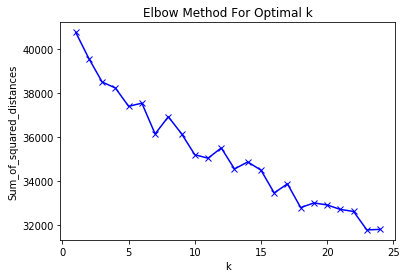

In [88]:
Sum_of_squared_distances = []
K = range(1,25)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(data_transformed)
    print(km.inertia_)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [99]:
km = KMeans(n_clusters=8)
kme = km.fit(textvector_mod)

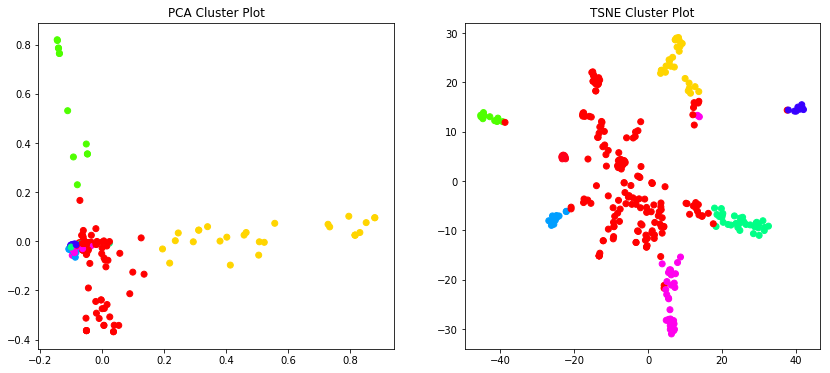

In [100]:
def plot_tsne_pca(data, labels):
    max_label = max(labels)
    max_items = np.random.choice(range(data.shape[0]), size=700, replace=False)
    
    pca = PCA(n_components=2).fit_transform(data[max_items,:].todense())
    tsne = TSNE().fit_transform(PCA(n_components=10).fit_transform(data[max_items,:].todense()))
    
    
    idx = np.random.choice(range(pca.shape[0]), size=300, replace=False)
    label_subset = labels[max_items]
    label_subset = [cm.hsv(i/max_label) for i in label_subset[idx]]
    
    f, ax = plt.subplots(1, 2, figsize=(14, 6))
    
    ax[0].scatter(pca[idx, 0], pca[idx, 1], c=label_subset)
    ax[0].set_title('PCA Cluster Plot')
    
    ax[1].scatter(tsne[idx, 0], tsne[idx, 1], c=label_subset)
    ax[1].set_title('TSNE Cluster Plot')
    
plot_tsne_pca(textvector_mod, km.predict(textvector_mod))

In [173]:
type(textvector)

scipy.sparse.csr.csr_matrix

In [141]:
data['cluster']=km.predict(textvector_mod)

In [79]:
pd.set_option('display.max_rows', 6000)

In [146]:
data['cluster']=data['text'].apply(lambda x:"Valid" if any(y in x.lower() for y in ["agreement","by laws","by law","bylaws","bylaw","indenture","underwriting","amendment"," plan "]) else "Invalid" )

In [150]:
data[data.cluster=='Invalid']

,Unnamed: 0,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,text,curtailed_text,op_text,cluster
0,0,119104618,734418872.0,328764637,EX-101,ex JPMorgan Chase at JPMCB JPMorgan Chase,jpmorgan chase jpmcb jpmorgan chase,jpmorgan chase jpmcb jpmorgan chase,Invalid
1,1,119104618,734418872.0,328764637,EX-2008,ex SF Loan GACC NAP Pads Loan GACC,sf loan gacc nap pads loan gacc,sf loan gacc nap pads loan gacc,Invalid
2,2,119484700,740857088.0,330107904,EX-99.1,Reports Continued in Quarter GAAP Grew Operati...,reports continued quarter gaap grew operating...,reports continued quarter gaap grew operating ...,Invalid
3,3,119482149,740799682.0,330099611,EX-99.1,Preliminary Second Quarter Results and Provide...,preliminary second quarter results provides o...,preliminary second quarter results provides op...,Invalid
4,4,119163985,735457280.0,328891854,EX-99.3,For of Its Outstanding Senior Notes and PASADENA,outstanding senior notes pasadena,outstanding senior notes pasadena,Invalid
5,5,119163985,735457280.0,328891854,EX-99.1,For Pricing of for Any and All of Its Outstand...,pricing outstanding senior notes,pricing outstanding senior notes,Invalid
6,6,119163985,735457280.0,328891854,EX-99.2,For of for Any and All of Its Outstanding Seni...,outstanding senior notes,outstanding senior notes,Invalid
7,7,119497389,741092280.0,330132825,EX-101.,Document SCH XBRL Taxonomy Extension CALC XBRL...,document sch xbrl taxonomy extension calc xbr...,document sch xbrl taxonomy extension calc xbrl...,Invalid
8,8,119047464,733385754.0,328635241,EX-31.1,CERTIFICATION CERTIFICATION PURSUANT TO SECTIO...,certification certification pursuant section ...,certification certification pursuant section o...,Invalid
9,9,119047464,733385754.0,328635241,EX-32.1,CERTIFICATION CERTIFICATION PURSUANT TO U S C ...,certification certification pursuant u c sect...,certification certification pursuant u c secti...,Invalid


In [145]:
data.shape

(5674, 9)

In [104]:
data.cluster.unique()

array([0, 6, 7, 1, 5, 2, 3, 4], dtype=int64)

In [36]:
data_16=data[data.cluster==16]

In [37]:
data_16.shape

(3144, 9)

In [49]:
vect_word_16 = TfidfVectorizer(max_features=4800, lowercase=True, analyzer='word',
                        stop_words= 'english',ngram_range=(1,3),dtype=np.float32)
textvector_16 = vect_word_16.fit_transform(data_16['op_text'])

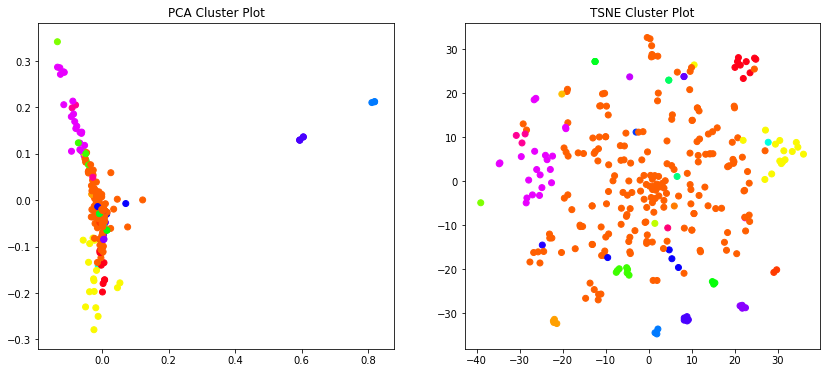

In [146]:
km_16 = KMeans(n_clusters=48)
kme_16 = km_16.fit(textvector_16)
plot_tsne_pca(textvector_16, km_16.predict(textvector_16))

In [62]:
data_16['clus_lbl']=km_16.predict(textvector_16)

C:\Users\lingadhar_duggirala\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [63]:
data_16

,Unnamed: 0,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,text,curtailed_text,op_text,cluster,clus_lbl
0,0,119104618,734418872.0,328764637,EX-101,ex JPMorgan Chase at JPMCB JPMorgan Chase,jpmorgan chase jpmcb jpmorgan chase,jpmorgan chase jpmcb jpmorgan chase,16,3
1,1,119104618,734418872.0,328764637,EX-2008,ex SF Loan GACC NAP Pads Loan GACC,sf loan gacc nap pads loan gacc,sf loan gacc nap pads loan gacc,16,3
2,2,119484700,740857088.0,330107904,EX-99.1,Reports Continued in Quarter GAAP Grew Operati...,reports continued quarter gaap grew operating...,reports continued quarter gaap grew operating ...,16,3
4,4,119163985,735457280.0,328891854,EX-99.3,For of Its Outstanding Senior Notes and PASADENA,outstanding senior notes pasadena,outstanding senior notes pasadena,16,3
5,5,119163985,735457280.0,328891854,EX-99.1,For Pricing of for Any and All of Its Outstand...,pricing outstanding senior notes,pricing outstanding senior notes,16,3
6,6,119163985,735457280.0,328891854,EX-99.2,For of for Any and All of Its Outstanding Seni...,outstanding senior notes,outstanding senior notes,16,3
10,10,119451586,740167692.0,330020516,EX-103,Back To Top,back top,back top,16,3
13,13,119451586,740167692.0,330020516,EX-103,Back To Top,back top,back top,16,3
14,14,119636065,743314424.0,330563255,EX-99.1,LP Reports Financial Results for the Ended Jun...,lp reports financial results ended june distr...,lp reports financial results ended june distri...,16,3
15,15,119636065,743314424.0,330563255,EX-99.2,Financial Report for the Three and June Manage...,financial report three june management operat...,financial report three june management operati...,16,3


In [91]:
data_16['relevancy']=data_16.clus_lbl.apply(lambda x:"Relevant" if x in [35,9,47,6,20,17,11,29,19] else "Irrelevant")

C:\Users\lingadhar_duggirala\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [107]:
data_16['relevancy']=data_16.clus_lbl.apply(lambda x:"Relevant" if x in [35,9,47,6,20,17,11,29,19] else "Irrelevant")

for ind,row in data_16.iterrows():
    if any(x in row['text'].lower() for x in ["indenture","by laws","by law","amendment","amendments"]):
        print(ind)
        data_16.loc[ind,['relevancy']]="Relevant"

26
57
86
129
145
147
190

C:\Users\lingadhar_duggirala\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s



224
378
395
583
600
605
621
630
680
711
713
716
785
786
903
949
973
975
1072
1073
1162
1164
1249
1250
1335
1342
1343
1344
1345
1346
1347
1350
1364
1420
1430
1431
1433
1451
1466
1467
1505
1508
1519
1595
1652
1756
1765
1781
1846
1878
1888
1890
1892
1898
1900
1920
1921
2029
2062
2097
2100
2105
2117
2217
2234
2235
2255
2266
2299
2300
2391
2402
2493
2495
2509
2513
2514
2598
2626
2627
2649
2708
2718
2727
2740
2743
2745
2795
2796
2876
3039
3073
3102
3152
3153
3282
3372
3478
3559
3607
3666
3756
3762
3780
3798
3845
3847
3999
4036
4038
4053
4057
4058
4060
4063
4090
4094
4096
4100
4102
4103
4107
4112
4196
4197
4336
4361
4492
4496
4500
4568
4570
4634
4835
4879
4923
4936
4976
5022
5025
5026
5075
5246
5321
5404
5430
5446
5467
5473
5474
5559
5659
5663


In [108]:
data_16

,Unnamed: 0,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,text,curtailed_text,op_text,cluster,clus_lbl,relevancy
0,0,119104618,734418872.0,328764637,EX-101,ex JPMorgan Chase at JPMCB JPMorgan Chase,jpmorgan chase jpmcb jpmorgan chase,jpmorgan chase jpmcb jpmorgan chase,16,3,Irrelevant
1,1,119104618,734418872.0,328764637,EX-2008,ex SF Loan GACC NAP Pads Loan GACC,sf loan gacc nap pads loan gacc,sf loan gacc nap pads loan gacc,16,3,Irrelevant
2,2,119484700,740857088.0,330107904,EX-99.1,Reports Continued in Quarter GAAP Grew Operati...,reports continued quarter gaap grew operating...,reports continued quarter gaap grew operating ...,16,3,Irrelevant
4,4,119163985,735457280.0,328891854,EX-99.3,For of Its Outstanding Senior Notes and PASADENA,outstanding senior notes pasadena,outstanding senior notes pasadena,16,3,Irrelevant
5,5,119163985,735457280.0,328891854,EX-99.1,For Pricing of for Any and All of Its Outstand...,pricing outstanding senior notes,pricing outstanding senior notes,16,3,Irrelevant
6,6,119163985,735457280.0,328891854,EX-99.2,For of for Any and All of Its Outstanding Seni...,outstanding senior notes,outstanding senior notes,16,3,Irrelevant
10,10,119451586,740167692.0,330020516,EX-103,Back To Top,back top,back top,16,3,Irrelevant
13,13,119451586,740167692.0,330020516,EX-103,Back To Top,back top,back top,16,3,Irrelevant
14,14,119636065,743314424.0,330563255,EX-99.1,LP Reports Financial Results for the Ended Jun...,lp reports financial results ended june distr...,lp reports financial results ended june distri...,16,3,Irrelevant
15,15,119636065,743314424.0,330563255,EX-99.2,Financial Report for the Three and June Manage...,financial report three june management operat...,financial report three june management operati...,16,3,Irrelevant


In [109]:
data_nt_16=data[data.cluster!=16]

In [111]:
data_nt_16

,Unnamed: 0,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,text,curtailed_text,op_text,cluster
3,3,119482149,740799682.0,330099611,EX-99.1,Preliminary Second Quarter Results and Provide...,preliminary second quarter results provides o...,preliminary second quarter results provides op...,10
7,7,119497389,741092280.0,330132825,EX-101.,Document SCH XBRL Taxonomy Extension CALC XBRL...,document sch xbrl taxonomy extension calc xbr...,document sch xbrl taxonomy extension calc xbrl...,9
8,8,119047464,733385754.0,328635241,EX-31.1,CERTIFICATION CERTIFICATION PURSUANT TO SECTIO...,certification certification pursuant section ...,certification certification pursuant section o...,35
9,9,119047464,733385754.0,328635241,EX-32.1,CERTIFICATION CERTIFICATION PURSUANT TO U S C ...,certification certification pursuant u c sect...,certification certification pursuant u c secti...,32
11,11,119451586,740167692.0,330020516,EX-102,AHFC false PILOT false TN false false false fa...,ahfc false pilot false tn false false false f...,ahfc false pilot false tn false false false fa...,24
12,12,119451586,740167692.0,330020516,EX-102,AHFC false PILOT false TN false false false fa...,ahfc false pilot false tn false false false f...,ahfc false pilot false tn false false false fa...,24
22,22,119238269,736639472.0,329038412,EX-102,NMAC true QX WD FICO false NC false false fals...,nmac true qx wd fico false nc false false fal...,nmac true qx wd fico false nc false false fals...,18
23,23,119238269,736639472.0,329038412,EX-102,NMAC true QX WD FICO false NC false false fals...,nmac true qx wd fico false nc false false fal...,nmac true qx wd fico false nc false false fals...,18
29,29,119486901,740872930.0,330113990,EX-23.1,th B Telephone Fax www kpmg ca Consent of Regi...,th b telephone fax www kpmg ca consent regist...,th b telephone fax www kpmg ca consent registe...,22
37,37,119288885,737448624.0,329155609,EX-101.,Document SCH XBRL Taxonomy XBRL Taxonomy Calcu...,document sch xbrl taxonomy xbrl taxonomy calc...,document sch xbrl taxonomy xbrl taxonomy calcu...,9


In [113]:
data_nt_16["relevancy"]=data_nt_16.cluster.apply(lambda x:"Relevant" if x in [14,41,33,30,40,0,33] else "Irrelevant")

C:\Users\lingadhar_duggirala\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [115]:
data_nt_16.head(4)

,Unnamed: 0,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,text,curtailed_text,op_text,cluster,relevancy
3,3,119482149,740799682.0,330099611,EX-99.1,Preliminary Second Quarter Results and Provide...,preliminary second quarter results provides o...,preliminary second quarter results provides op...,10,Irrelevant
7,7,119497389,741092280.0,330132825,EX-101.,Document SCH XBRL Taxonomy Extension CALC XBRL...,document sch xbrl taxonomy extension calc xbr...,document sch xbrl taxonomy extension calc xbrl...,9,Irrelevant
8,8,119047464,733385754.0,328635241,EX-31.1,CERTIFICATION CERTIFICATION PURSUANT TO SECTIO...,certification certification pursuant section ...,certification certification pursuant section o...,35,Irrelevant
9,9,119047464,733385754.0,328635241,EX-32.1,CERTIFICATION CERTIFICATION PURSUANT TO U S C ...,certification certification pursuant u c sect...,certification certification pursuant u c secti...,32,Irrelevant


In [122]:
data_16.columns

Index(['Unnamed: 0', 'KeyFileCollection', 'SNPVersionID',
       'KeyFileCollectionDetail', 'exhibit', 'text', 'curtailed_text',
       'op_text', 'cluster', 'clus_lbl', 'relevancy'],
      dtype='object')

In [123]:
data_nt_16.columns

Index(['Unnamed: 0', 'KeyFileCollection', 'SNPVersionID',
       'KeyFileCollectionDetail', 'exhibit', 'text', 'curtailed_text',
       'op_text', 'cluster', 'relevancy'],
      dtype='object')

In [124]:
data_final=pd.concat([data_16[['KeyFileCollection','SNPVersionID','KeyFileCollectionDetail','exhibit','relevancy']],data_nt_16[['KeyFileCollection','SNPVersionID','KeyFileCollectionDetail','exhibit','relevancy']]])

In [126]:
data_final.shape

(5674, 5)

In [128]:
data_tst=pd.read_csv("C:\\Users\\lingadhar_duggirala\\Desktop\\Keydocs\\today_data.csv")

data_tst.text=data_tst.text.apply(lambda x:re.sub("\d+","",str(x)))
data_tst.text=data_tst.text.apply(lambda x:ne_removal(" ".join(str(x).split()[0:25])))

data_tst["curtailed_text"]=""
for ind,row in data_tst.iterrows():
    data_tst.loc[ind,['curtailed_text']]=text_preprocess(str(row['text']))
    
data_tst['op_text']=data_tst.curtailed_text.apply(lambda x:" ".join(x.split()[0:15]))

testvector = vect_word.transform(data_tst['op_text'])

data_tst['cluster']=km.predict(testvector)

data_tst_16=data_tst[data_tst.cluster==16]

testvector_16 = vect_word_16.transform(data_tst_16['op_text'])

data_tst_16['clus_lbl']=km_16.predict(testvector_16)

data_tst_16['relevancy']=data_tst_16.clus_lbl.apply(lambda x:"Relevant" if x in [35,9,47,6,20,17,11,29,19] else "Irrelevant")

for ind,row in data_tst_16.iterrows():
    if any(x in row['text'].lower() for x in ["indenture","by laws","by law","amendment","amendments"]):
        data_tst_16.loc[ind,['relevancy']]="Relevant"
        
data_tst_nt_16=data_tst[data_tst.cluster!=16]

data_tst_nt_16["relevancy"]=data_tst_nt_16.cluster.apply(lambda x:"Relevant" if x in [14,41,33,30,40,0,33] else "Irrelevant")

data_tst_final=pd.concat([data_tst_16[['KeyFileCollection','SNPVersionID','KeyFileCollectionDetail','exhibit','relevancy']],data_tst_nt_16[['KeyFileCollection','SNPVersionID','KeyFileCollectionDetail','exhibit','relevancy']]])

C:\Users\lingadhar_duggirala\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\lingadhar_duggirala\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\lingadhar_duggirala\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = 

109
171


In [131]:
data_tst_final.to_excel("C:\\Users\\lingadhar_duggirala\\Desktop\\Keydocs\\final_results.xlsx")

In [425]:
data_tst["curtailed_text"]=""
for ind,row in data_tst.iterrows():
    data_tst.loc[ind,['curtailed_text']]=text_preprocess(str(row['text']))

In [426]:
data_tst["op_text"]=data_tst.curtailed_text.apply(lambda x:" ".join(x.split()[0:15]))

In [427]:
testdata = vect_word.transform(data_tst['op_text'])

In [428]:
test_labels=km.predict(testdata)

In [430]:
data_tst['cluster_no_1']=test_labels

In [302]:
pd.set_option('display.max_rows', 6000)

In [431]:
data_tst

,Unnamed: 0,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,text,curtailed_text,op_text,cluster_no_1,relevancy_1
0,0,119634691,743330866.0,330559746,EX-99.1,FOR IMMEDIATE RELEASE Contact Clarissa Willett...,for immediate release contact clarissa willett...,for immediate release contact clarissa willett...,18,Irrelevant
1,1,119654529,743506924.0,330627442,EX-99.1,Schedule A Trade Date CUSIP Settlement Date Ma...,schedule a trade date cusip settlement date ma...,schedule a trade date cusip settlement date ma...,21,Irrelevant
2,2,119636504,743358792.0,330564420,EX-99.1,Contact Information Investor Relations 941 556...,contact information investor relations investo...,contact information investor relations investo...,21,Irrelevant
3,3,119640710,743390946.0,330577855,EX-99.1,News From Royal Caribbean Cruises Ltd Corporat...,news from royal caribbean cruises ltd corporat...,news from royal caribbean cruises ltd corporat...,21,Irrelevant
4,4,119655585,743538532.0,330630929,EX-99.1,KIRBY CORPORATION Contact Eric Holcomb 713 435...,kirby corporation contact eric holcomb for imm...,kirby corporation contact eric holcomb for imm...,13,Irrelevant
5,5,119636394,743327438.0,330564125,EX-99.1,LAZARD LTD REPORTS SECOND QUARTER AND FIRST HA...,lazard ltd reports second quarter and first ha...,lazard ltd reports second quarter and first ha...,13,Irrelevant
6,6,119635374,743334320.0,330561467,EX-99,1201 S Second Street Milwaukee WI 53204 USA Ne...,s second street milwaukee wi usa news release...,s second street milwaukee wi usa news release ...,18,Irrelevant
7,7,119636952,743334454.0,330565724,EX-99.1,Dow reports second quarter 2019 results FINANC...,dow reports second quarter results financial h...,dow reports second quarter results financial h...,13,Irrelevant
8,8,119638874,743387228.0,330572763,EX-99.1,Adaptimmune Starts SPEARHEAD 1 Trial with ADP ...,adaptimmune starts spearhead trial with adp a ...,adaptimmune starts spearhead trial with adp a ...,21,Irrelevant
9,9,119642385,743409436.0,330581632,EX-99.1,News Release Air Products and Chemicals Inc 72...,news release air products and chemicals inc ha...,news release air products and chemicals inc ha...,18,Irrelevant


In [239]:
data_tst.text[155]

'CERTIFICATION PURSUANT TO 18 U S C SECTION 1350 AS ADOPTED PURSUANT TO SECTION 906 OF THE SARBANES OXLEY ACT OF 2002 In connection with the Quarterly Report on Form 10 Q of PolyOne Corporation the Company for the period ended June 30 2019 as filed with the Securities and Exchange Commission on the date hereof the Report I Robert M Patterson President and Chief Executive Officer of the Company do hereby certify pursuant to 18 U S C 1350 as adopted pursuant to 906 of the Sarbanes Oxley Act of 2002 that to my knowledge 1 The Report fully complies with the requirements of Section 13 a or 15 d of the Securities Exchange Act of 1934 and 2 The information contained in the Report fairly presents in all material respects the financial condition and results of operations of the Company as of the dates and for the periods expressed in the Report s Robert M Patterson Robert M Patterson Chairman President and Chief Executive Officer July 25 2019 The foregoing certification is being furnished solel

In [287]:
data_tst['relevancy_1']=data_tst.cluster_no_1.apply(lambda x:'Relevant' if x in (14,16,36,46,53,54,85,95,99,100) else 'Irrelevant')

In [153]:
txt=nlp(re.sub("\d+","",data.text[3]))

In [142]:
sr

''

In [288]:
sample_df=data_tst[["KeyFileCollection","SNPVersionID","KeyFileCollectionDetail","exhibit","relevancy_1"]]

In [289]:
sample_df

,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,relevancy_1
0,119634691,743330866.0,330559746,EX-99.1,Irrelevant
1,119654529,743506924.0,330627442,EX-99.1,Irrelevant
2,119636504,743358792.0,330564420,EX-99.1,Irrelevant
3,119640710,743390946.0,330577855,EX-99.1,Irrelevant
4,119655585,743538532.0,330630929,EX-99.1,Irrelevant
5,119636394,743327438.0,330564125,EX-99.1,Irrelevant
6,119635374,743334320.0,330561467,EX-99,Irrelevant
7,119636952,743334454.0,330565724,EX-99.1,Irrelevant
8,119638874,743387228.0,330572763,EX-99.1,Irrelevant
9,119642385,743409436.0,330581632,EX-99.1,Irrelevant


In [237]:
sample_df.to_excel("C:\\Users\\lingadhar_duggirala\\Desktop\\Keydocs\\Doc_relevancy_samples_3.xlsx")

In [240]:
data_tst.head(5)

,Unnamed: 0,KeyFileCollection,SNPVersionID,KeyFileCollectionDetail,exhibit,text,curtailed_text,op_text,cluster_no_1,relevancy_1
0,0,119634691,743330866.0,330559746,EX-99.1,FOR IMMEDIATE RELEASE Contact Clarissa Willett...,for immediate release contact clarissa willett...,for immediate release contact clarissa willett...,1,Relevant
1,1,119654529,743506924.0,330627442,EX-99.1,Schedule A Trade Date CUSIP Settlement Date Ma...,schedule a trade date cusip settlement date ma...,schedule a trade date cusip settlement date ma...,1,Relevant
2,2,119636504,743358792.0,330564420,EX-99.1,Contact Information Investor Relations 941 556...,contact information investor relations investo...,contact information investor relations investo...,1,Relevant
3,3,119640710,743390946.0,330577855,EX-99.1,News From Royal Caribbean Cruises Ltd Corporat...,news from royal caribbean cruises ltd corporat...,news from royal caribbean cruises ltd corporat...,1,Relevant
4,4,119655585,743538532.0,330630929,EX-99.1,KIRBY CORPORATION Contact Eric Holcomb 713 435...,kirby corporation contact eric holcomb for imm...,kirby corporation contact eric holcomb for imm...,1,Relevant


In [180]:
data_tst.text[288]

'RECENT DEVELOPMENTS RECENT DEVELOPMENTS TOTAL announces the second 2019 interim dividend of 0 66 share an increase of 3 1 compared to 2018 The Board of Directors at the meeting held on July 24 2019 declared the distribution of the second 2019 interim dividend at an amount of 0 66 share an increase of 3 1 from the interim and final dividends paid in 2018 in accordance with the shareholder return policy for 2018 2020 This interim dividend stable compared to the first 2019 interim dividend will be detached and paid according to the following timetable Shareholders ADS holders Ex dividend date January 6 2020 January 2 2020 Payment date January 8 2020 January 28 2020 Total will develop the LNG market in Benin On July 24 2019 TOTAL S A together with its direct and indirect consolidated companies located in or outside of France TOTAL or the Group announced the signing with the Republic of Benin and the Soci t B ninoise d Energie Electrique SBEE of the Gas Supply Agreement and the Host Govern

In [171]:
data_tst.dtypes

Unnamed: 0                   int64
KeyFileCollection            int64
SNPVersionID               float64
KeyFileCollectionDetail      int64
exhibit                     object
text                        object
curtailed_text              object
op_text                     object
cluster_no                   int32
dtype: object

In [154]:
sr=""
for w in txt.ents:
    print(w)
    if ent.label_!='ORG':
        print(ent.text,ent.label_)

Provides an Operational Update DENVER
New York GPE
Colorado
New York GPE
  
New York GPE
Globe Newswire Bonanza Creek Energy Inc
New York GPE
Bonanza Creek
New York GPE
today
New York GPE
second
New York GPE
second
New York GPE
 
New York GPE
Highlights
New York GPE
Second
New York GPE
approximately   thousand barrels
New York GPE
MBoe
New York GPE
 
New York GPE
 
New York GPE
Second quarter
New York GPE
LOE
New York GPE
  Boe
New York GPE
  Boe
New York GPE
the first quarter  Second quarter
New York GPE
  Boe
New York GPE
  Boe
New York GPE
the first quarter  Second quarter
New York GPE
RMI
New York GPE
  Boe
New York GPE
Second quarter
New York GPE
  million Operations
New York GPE
July
New York GPE
Riverside Terminal
New York GPE
the second quarter
New York GPE
 
New York GPE
approximately  million
New York GPE
Mid year
New York GPE
  MMBoe
New York GPE
  MMBoe
New York GPE
 
New York GPE
 
New York GPE
Bonanza Creek
New York GPE
second
New York GPE
Eric Greager
New York GPE
Compan